# Deep Learning Final Project - Fake Anime Faces
### Danh Nguyne & Jared Mlekush

In [3]:
import os
len(os.listdir('anime_faces/root/faces'))

63566

# __Importing Required Libraries__

In [4]:
import torch
from torch import nn, optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms

from torchsummary import summary
import wandb


import os, shutil
import imageio
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

print('Pytorch Version:', torch.__version__)
print('GPU Available:', torch.cuda.is_available())

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Setting device to:', device)

ckpt_root = 'model/'
if not os.path.isdir(ckpt_root):
    os.mkdir(ckpt_root)
    print('Making checkpoint dir for first time...')

progress_dir = os.path.join(ckpt_root, 'progress')
if not os.path.isdir(progress_dir):
    os.mkdir(progress_dir)
    print('Making progress dir for first time...')

Pytorch Version: 1.9.0+cu102
GPU Available: True
Setting device to: cuda


# __Creating data iterator__


In [9]:
# need to have root/
train_images = ImageFolder('~/Fake_anime_faces/anime_faces/root', transform = transforms.Compose([transforms.Resize(136),
                                                                     transforms.CenterCrop(128),
                                                                     transforms.RandomHorizontalFlip(p=0.8),
                                                                     transforms.ToTensor(),
                                                                     transforms.Normalize((.5, .5, .5), (.5, .5, .5))]))

# __Visualizing sample images from true data__

In [10]:
def visualize_image(image):
    plt.figure(figsize = (5, 5))
    image = (image + 1) / 2

    plt.imshow(image.permute(1, 2, 0))
    plt.axis('off')
    plt.show()
    
def visualize_batch(images_list, size = 14, shape = (6, 6), title = None, save = None, return_images = False):
    images_list = (images_list - images_list.min())/(images_list.max() - images_list.min())

    fig = plt.figure(figsize = (size, size))
    grid = ImageGrid(fig, 111, nrows_ncols = shape, axes_pad = 0.04)
    for ax, image in zip(grid, images_list):
        ax.imshow(image.permute(1, 2, 0))
        ax.axis('off')

    if title:
        print(title)
    if save:
        plt.savefig(save)
    plt.show()
    
    if return_images:
        return images_list

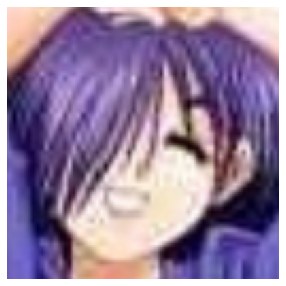

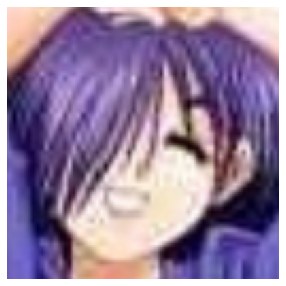

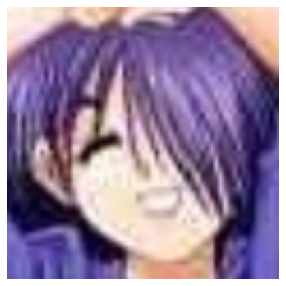

In [11]:
x, _ = train_images[0]
visualize_image(x)

x, _ = train_images[0]
visualize_image(x)

x, _ = train_images[0]
visualize_image(x)

In [12]:
len(train_images)

63565

# __Defining dataloader__

In [13]:
batch_size = 128
train_data = DataLoader(train_images, batch_size = batch_size, shuffle = True, drop_last = True)

In [14]:
for x, _ in train_data:
    break

print(x.shape, x.min(), x.max())

torch.Size([128, 3, 128, 128]) tensor(-1.) tensor(1.)


Training Batch Samples


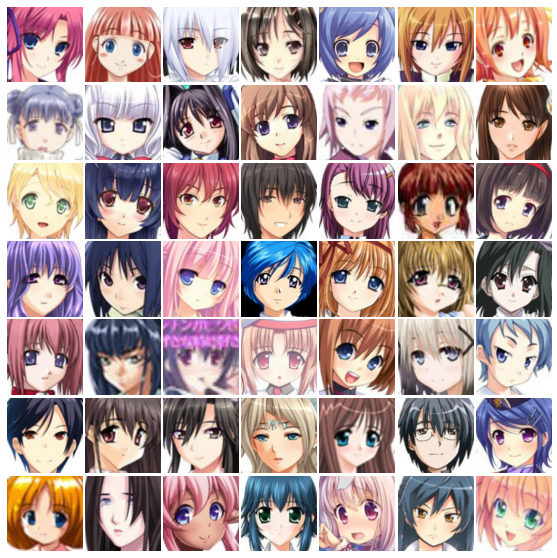

In [15]:
visualize_batch(x[:49], shape = (7, 7), size = 10, title = 'Training Batch Samples')

# __Creating the discriminator__

In [16]:
class Discriminator(nn.Module):
    def __init__(self, maps = 64):
        super(Discriminator, self).__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, maps, 4, 2, 1),
            nn.LeakyReLU(0.2), # shape -> maps, 64, 64
            
            nn.Conv2d(maps, 2 * maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(2 * maps),
            nn.LeakyReLU(0.2), # shape -> 2 * maps, 32, 32
            
            nn.Conv2d(2 * maps, 4 * maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(4 * maps),
            nn.LeakyReLU(0.2), # shape -> 4 * maps, 16, 16
            
            nn.Conv2d(4 * maps, 8 * maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(8 * maps),
            nn.LeakyReLU(0.2), # shape -> 8 * maps, 8, 8
            
            nn.Conv2d(8 * maps, 16 * maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(16 * maps),
            nn.LeakyReLU(0.2), # shape -> 16 * maps, 4, 4
            

        )

        self.outputs = nn.Sequential(
            nn.Conv2d(16 * maps, 1, 4, 1, 0),
            nn.Flatten()
        )

    def forward(self, x):
        x = self.features(x)
        return self.outputs(x)

# __Summarizing the discriminator__

In [17]:
discriminator = Discriminator(maps = 64).to(device)
summary(discriminator, (3, 128, 128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           3,136
         LeakyReLU-2           [-1, 64, 64, 64]               0
            Conv2d-3          [-1, 128, 32, 32]         131,072
       BatchNorm2d-4          [-1, 128, 32, 32]             256
         LeakyReLU-5          [-1, 128, 32, 32]               0
            Conv2d-6          [-1, 256, 16, 16]         524,288
       BatchNorm2d-7          [-1, 256, 16, 16]             512
         LeakyReLU-8          [-1, 256, 16, 16]               0
            Conv2d-9            [-1, 512, 8, 8]       2,097,152
      BatchNorm2d-10            [-1, 512, 8, 8]           1,024
        LeakyReLU-11            [-1, 512, 8, 8]               0
           Conv2d-12           [-1, 1024, 4, 4]       8,388,608
      BatchNorm2d-13           [-1, 1024, 4, 4]           2,048
        LeakyReLU-14           [-1, 102

# __Creating the generator__

In [18]:
class Generator(nn.Module):
    def __init__(self, maps = 64, noise_size = 128):
        super(Generator, self).__init__()

        self.model = nn.Sequential(
            nn.ConvTranspose2d(noise_size, 16 * maps, 4, 1, 0, bias = False),
            nn.BatchNorm2d(16 * maps),
            nn.ReLU(), # shape -> 16 * maps, 4, 4

            nn.ConvTranspose2d(16 * maps, 8 * maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(8 * maps),
            nn.ReLU(), # shape -> 8 * maps, 8, 8

            nn.ConvTranspose2d(8 * maps, 4 * maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(4 * maps),
            nn.ReLU(), # shape -> 4 * maps, 16, 16

            nn.ConvTranspose2d(4 * maps, 2 * maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(2 * maps),
            nn.ReLU(), # shape -> 2 * maps, 32, 32

            nn.ConvTranspose2d(2 * maps, maps, 4, 2, 1, bias = False),
            nn.BatchNorm2d(maps),
            nn.ReLU(), # shape -> maps, 64, 64

            nn.ConvTranspose2d(maps, 3, 4, 2, 1),
            nn.Tanh() # shape -> 3, 128, 128
        )

    def forward(self, z):
        z = z.view(-1, 128, 1, 1)
        return self.model(z)

# __Summarizing the generator__

In [19]:
noise_size = 128
generator = Generator(maps = 64, noise_size = noise_size).to(device)
summary(generator, [[noise_size]])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1           [-1, 1024, 4, 4]       2,097,152
       BatchNorm2d-2           [-1, 1024, 4, 4]           2,048
              ReLU-3           [-1, 1024, 4, 4]               0
   ConvTranspose2d-4            [-1, 512, 8, 8]       8,388,608
       BatchNorm2d-5            [-1, 512, 8, 8]           1,024
              ReLU-6            [-1, 512, 8, 8]               0
   ConvTranspose2d-7          [-1, 256, 16, 16]       2,097,152
       BatchNorm2d-8          [-1, 256, 16, 16]             512
              ReLU-9          [-1, 256, 16, 16]               0
  ConvTranspose2d-10          [-1, 128, 32, 32]         524,288
      BatchNorm2d-11          [-1, 128, 32, 32]             256
             ReLU-12          [-1, 128, 32, 32]               0
  ConvTranspose2d-13           [-1, 64, 64, 64]         131,072
      BatchNorm2d-14           [-1, 64,

# __Initializing parameters__

In [20]:
def initializer(module):
    classname = module.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(module.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(module.weight.data, 0.0, 0.02)
        nn.init.constant_(module.bias.data, 0.0)

discriminator.apply(initializer), generator.apply(initializer)

print('Initialization done...')

Initialization done...


# __Defining loss functions__

In [21]:
ones = torch.ones(batch_size, 1).to(device)
zeros = torch.zeros(batch_size, 1).to(device)

def discrinimator_loss(true, false):
    return F.binary_cross_entropy_with_logits(true, ones) + F.binary_cross_entropy_with_logits(false, zeros)

def generator_loss(false):
    return F.binary_cross_entropy_with_logits(false, ones)

# __Defining optimizers__

In [25]:
epochs = 50
# lr = 0.0004
# lower the learning rate to reduce mode collapse
lr_dis = 0.0004
lr_gen = 0.0001

discriminator_optimizer = optim.Adam(discriminator.parameters(), lr = lr_dis, betas = (0.5, 0.999))
generator_optimizer = optim.Adam(generator.parameters(), lr = lr_gen, betas = (0.5, 0.999))

# __Defining helper functions for saving and loading checkpoints__

In [26]:
def save_checkpoint(epoch = 0, batch_index = 0):
    ckpt = {
        'fixed_z': fixed_z.cpu(),
        'generator': generator.state_dict(),
        'discriminator': discriminator.state_dict(),
        'generator_optimizer': generator_optimizer.state_dict(),
        'discriminator_optimizer': discriminator_optimizer.state_dict(),
        'epoch': epoch,
        'batch_index': batch_index
    }

    torch.save(ckpt, os.path.join(ckpt_root, 'ckpt.pth'))

def load_checkpoint():
    ckpt = torch.load(os.path.join(ckpt_root, 'ckpt.pth'))
    
    fixed_z = ckpt['fixed_z'].to(device)
    
    generator.load_state_dict(ckpt['generator'])
    discriminator.load_state_dict(ckpt['discriminator'])
    
    generator_optimizer.load_state_dict(ckpt['generator_optimizer'])
    discriminator_optimizer.load_state_dict(ckpt['discriminator_optimizer'])
    
    epoch = ckpt['epoch']
    batch_index = ckpt['batch_index']

    return fixed_z, epoch, batch_index

# __Defining noise generation functions__

In [27]:
def random_noise(size):
    return torch.normal(0, 1, size, device = device)

# __Performing Initial load__

In [28]:
# fixed_z = random_noise([36, noise_size])
# save_checkpoint()

In [29]:
fixed_z, start_epoch, start_batch_index = load_checkpoint()
print(f'Continuing from epoch {start_epoch} and batch index {start_batch_index}')

Continuing from epoch 0 and batch index 0


# __Setting up weights and biases for this run__

In [30]:
# wandb_id = wandb.util.generate_id()
wandb_id = "6f993ffbbfbe8c7e3092ff9c6075e66d2b2e5872"
print(wandb_id)
wandb.init(id = wandb_id, project = "Deep Learning Final", name = "Run 1")
wandb.config.update({
    'initial_lr': lr_gen,
    'noise_size': noise_size,
    'initialization': 'Normal Distribution',
    'beta1': 0.5,
})

6f993ffbbfbe8c7e3092ff9c6075e66d2b2e5872


wandb: Currently logged in as: coldsnape (use `wandb login --relogin` to force relogin)
wandb: wandb version 0.12.0 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


# __Training the model__

  0%|          | 0/496 [00:00<?, ?it/s]

wandb: Network error resolved after 0:02:16.905240, resuming normal operation.



Showing Generated Samples



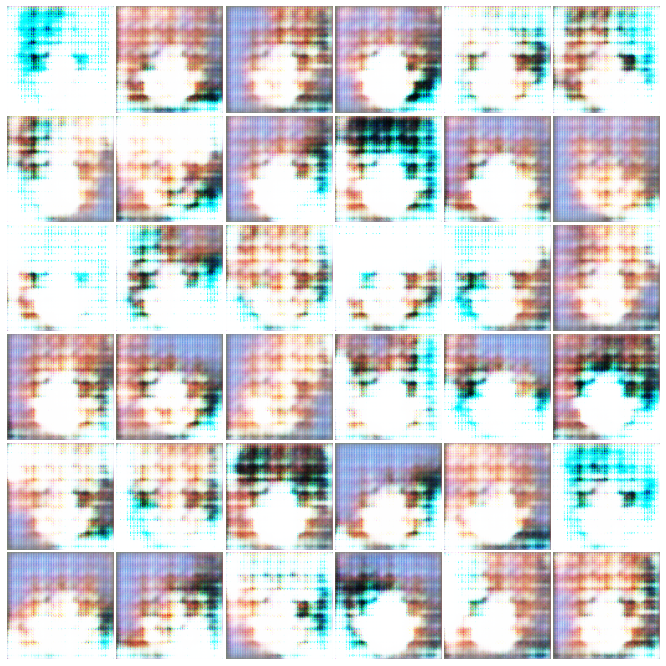


Epoch: 1
Generator Loss        : 5.06248
Discriminator Loss    : 0.30230


  0%|          | 0/496 [00:00<?, ?it/s]


Showing Generated Samples



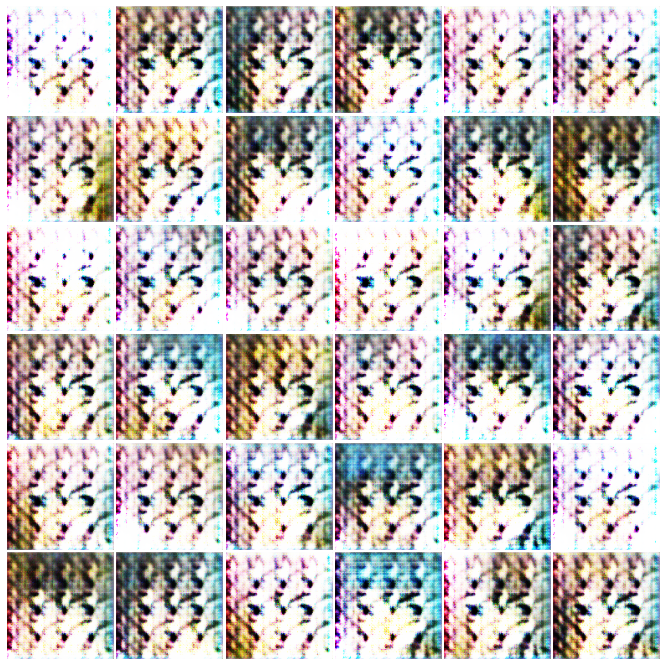


Epoch: 2
Generator Loss        : 5.76275
Discriminator Loss    : 0.37391


  0%|          | 0/496 [00:00<?, ?it/s]


Showing Generated Samples



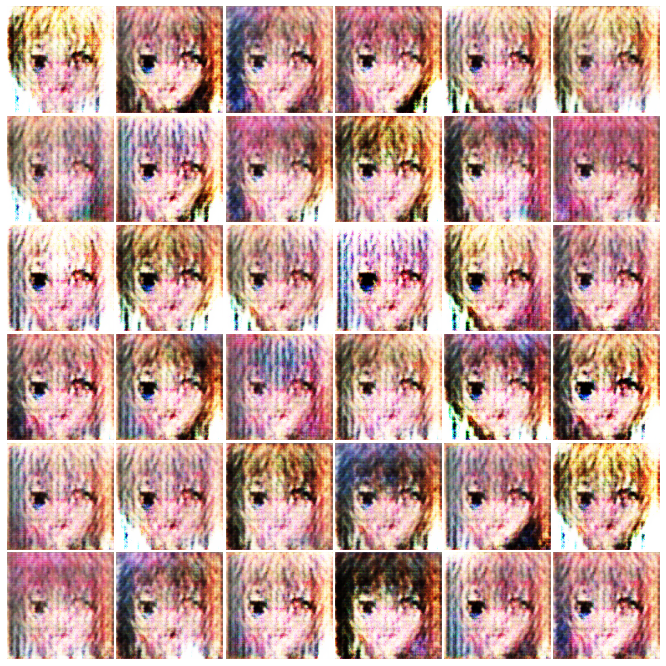


Epoch: 3
Generator Loss        : 6.97037
Discriminator Loss    : 0.36597


  0%|          | 0/496 [00:00<?, ?it/s]


Showing Generated Samples



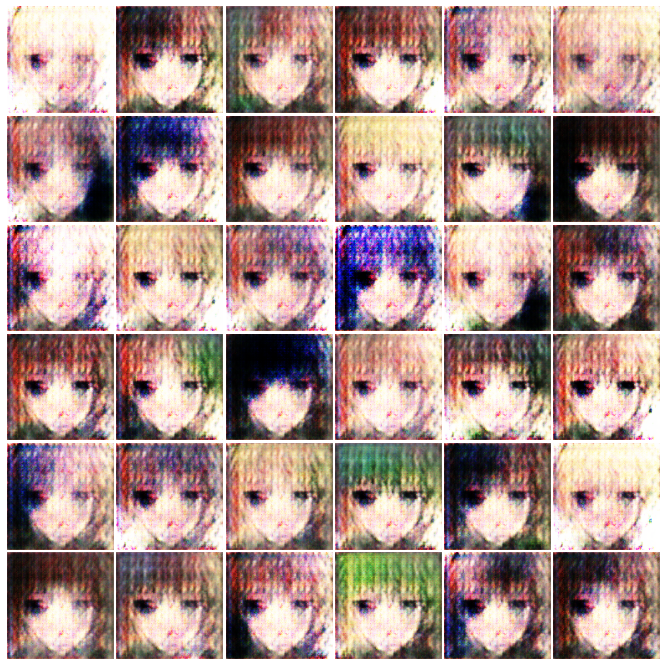


Epoch: 4
Generator Loss        : 7.40109
Discriminator Loss    : 0.34449


  0%|          | 0/496 [00:00<?, ?it/s]


Showing Generated Samples



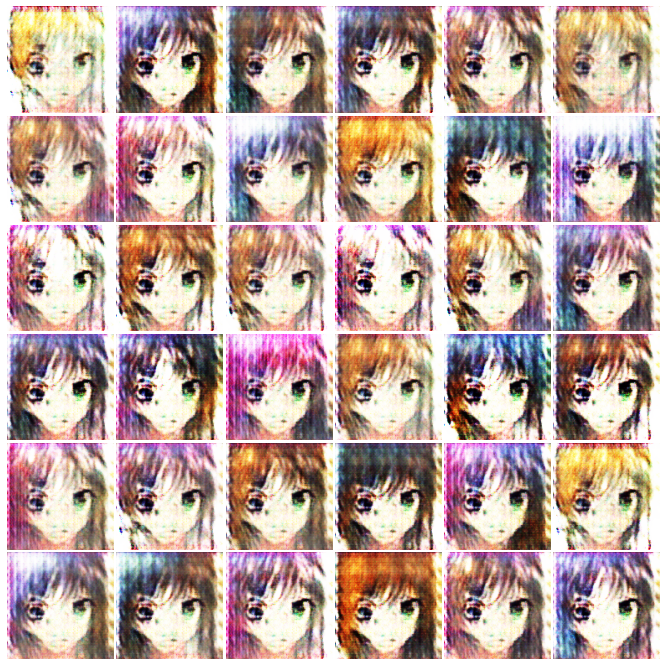


Epoch: 5
Generator Loss        : 7.50202
Discriminator Loss    : 0.27035


  0%|          | 0/496 [00:00<?, ?it/s]


Showing Generated Samples



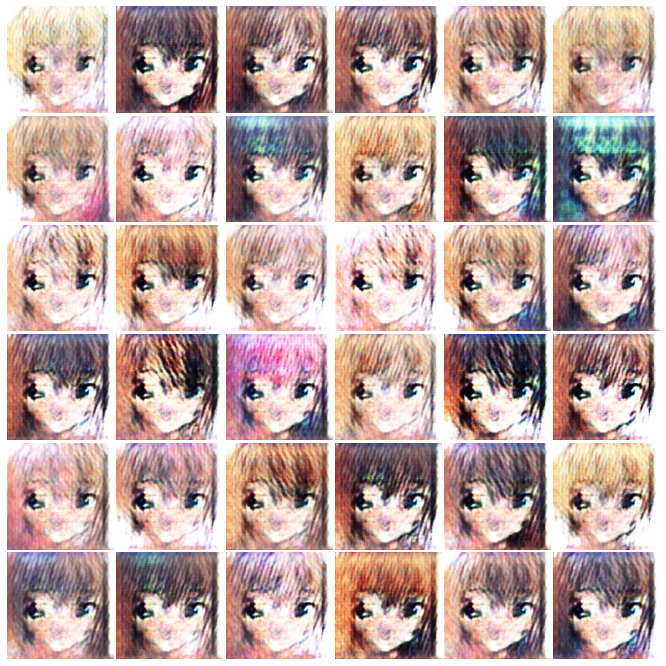


Epoch: 6
Generator Loss        : 7.86833
Discriminator Loss    : 0.27880


  0%|          | 0/496 [00:00<?, ?it/s]


Showing Generated Samples



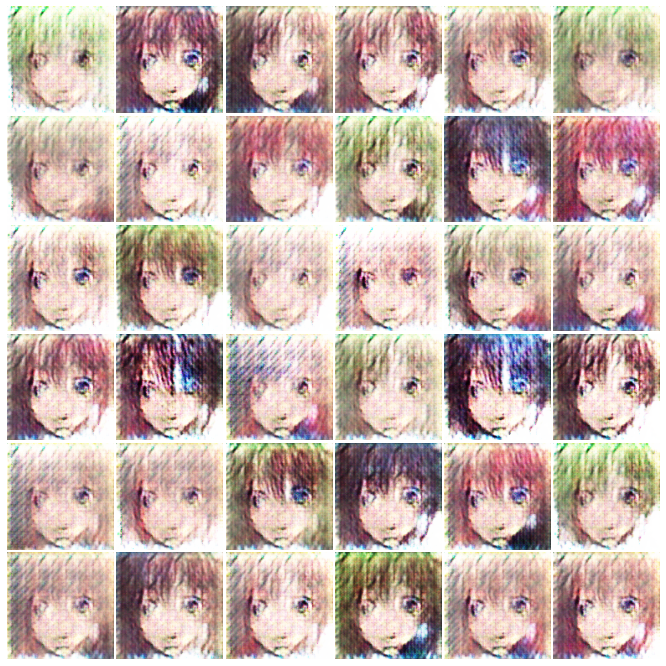


Epoch: 7
Generator Loss        : 8.53578
Discriminator Loss    : 0.23193


  0%|          | 0/496 [00:00<?, ?it/s]


Showing Generated Samples



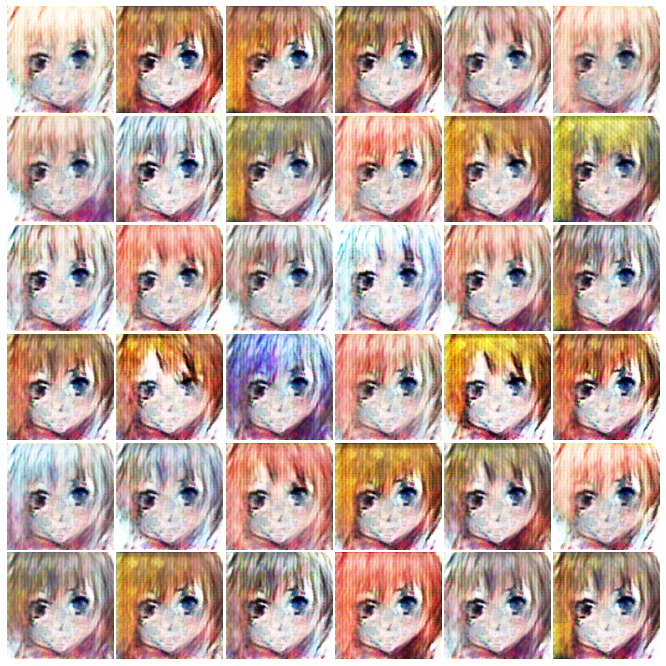


Epoch: 8
Generator Loss        : 7.99092
Discriminator Loss    : 0.20128


  0%|          | 0/496 [00:00<?, ?it/s]


Showing Generated Samples



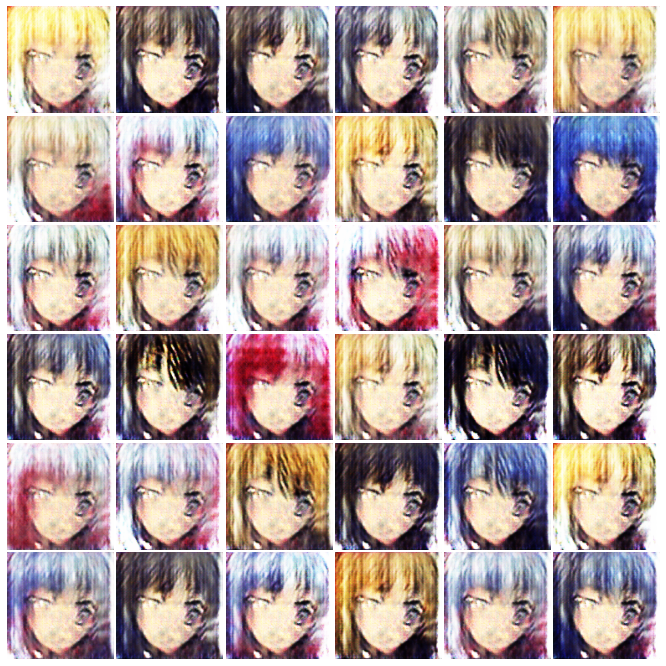


Epoch: 9
Generator Loss        : 8.49152
Discriminator Loss    : 0.17221


  0%|          | 0/496 [00:00<?, ?it/s]


Showing Generated Samples



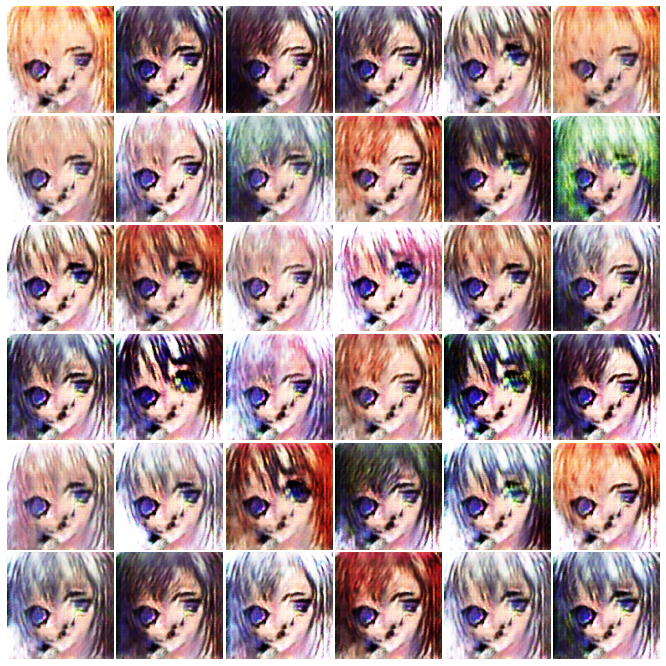


Epoch: 10
Generator Loss        : 8.61858
Discriminator Loss    : 0.18727


  0%|          | 0/496 [00:00<?, ?it/s]


Showing Generated Samples



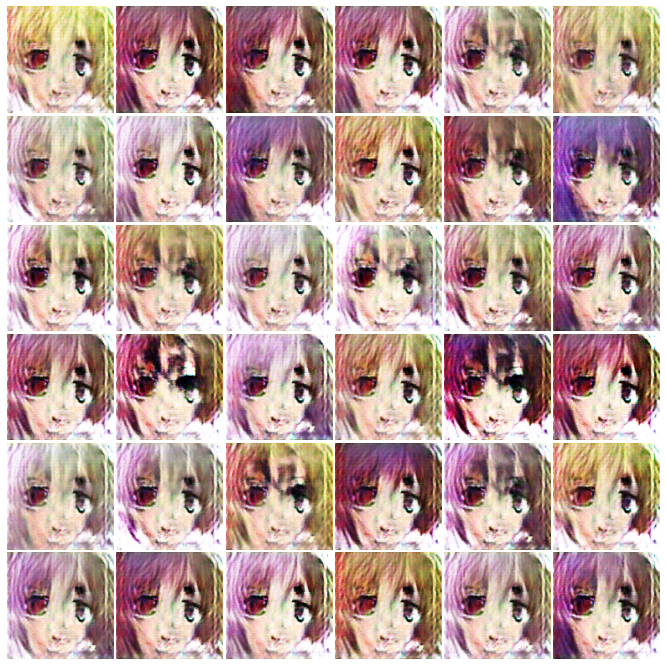


Epoch: 11
Generator Loss        : 8.27289
Discriminator Loss    : 0.11661


  0%|          | 0/496 [00:00<?, ?it/s]

In [ ]:
nan_break = False

discriminator.train()
generator.train()

for epoch in range(start_epoch, epochs):
    dcum_loss = 0.0
    gcum_loss = 0.0 
    
    dataloader = tqdm(train_data)
    
    for batch_index, (true_images, _) in enumerate(dataloader, start_batch_index):
        batch_size = true_images.size(0)
        true_images = true_images.cuda()

        # [=========== Training Discriminator ===========]
        discriminator_optimizer.zero_grad()
        
        true = discriminator(true_images)
        
        # Insert random noise to improve training
        false_images = generator(random_noise([batch_size, 128]))
        false = discriminator(false_images)

        d_loss = discrinimator_loss(true, false)
        d_loss.backward()
        discriminator_optimizer.step()
        
        # [============= Training Generator =============]
        generator_optimizer.zero_grad()
        
        # Insert random noise to improve training
        false_images = generator(random_noise([batch_size, 128]))
        
        false = discriminator(false_images)
        g_loss = generator_loss(false)
        g_loss.backward()
        generator_optimizer.step()

        dataloader.set_postfix(d_loss = d_loss.item(), g_loss = g_loss.item())

        with torch.no_grad():
            dcum_loss += d_loss.item()
            gcum_loss += g_loss.item()

            wandb.log({'d_loss': d_loss.item(), 'g_loss': g_loss.item()})

            if (batch_index + 1) % (len(train_data) // 4) == 0 and batch_index != start_batch_index:
                generator.eval()
                false_images = generator(fixed_z).cpu()
                path_name = f"epoch({str(epoch + 1).zfill(len(str(epochs)))})-batch({str(batch_index + 1).zfill(len(str(len(train_data))))}).jpg"
                    
                save_checkpoint

        if d_loss != d_loss or g_loss != g_loss:
            nan_break = True
            break
        
        if batch_index == len(train_data) - 1:
            break
       
    if nan_break:
        print(f'Nan loss occured at   : {epoch + 1}')
        print(f'Generator Loss        : {gcum_loss}')
        print(f'Discriminator Loss    : {dcum_loss}')
        break

    generator_images = visualize_batch(false_images,
                                                    shape = (6, 6),
                                                    size = 12,
                                                    save = os.path.join(progress_dir, path_name),
                                                    return_images = True,
                                                    title = "\nShowing Generated Samples\n")
    start_batch_index = 0

    print(f'\nEpoch: {epoch + 1}')
    print(f'Generator Loss        : {(gcum_loss/len(train_data)):.5f}')
    print(f'Discriminator Loss    : {(dcum_loss/len(train_data)):.5f}')

# __Generating progress gif__

In [ ]:
print(progress_dir)

In [ ]:
images = []
sorted_image_names = sorted(os.listdir(progress_dir))
for file_name in sorted_image_names:
    file_path = os.path.join(progress_dir, file_name)
    if os.path.isfile(file_path):
        images.append(imageio.imread(file_path))
imageio.mimsave('anime-progress.gif', images, fps = 8)

# __Performing Image Interpolation__

In [ ]:
def get_interpolations(noise1, noise2, num_interpolates):
    x = [((1.0 - (i/num_interpolates)) * noise1) + ((i/num_interpolates) * noise2) for i in range(num_interpolates + 1)]
    return torch.cat(x, dim = 0)

In [ ]:
with torch.no_grad():
    interpolations = []
    for _ in range(10):
        noise1 = random_noise([1, noise_size])
        noise2 = random_noise([1, noise_size])
        interpolations.append(get_interpolations(noise1, noise2, 9).to(device))
    
    interpolations = torch.cat(interpolations, dim = 0)
    false_images = generator(interpolations).cpu()
    print(f'\nShowing Generated Samples\n')
    visualize_batch(false_images, shape = (10, 10), size = 16, save = None)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=50b65152-f3e0-4d02-abd0-a6a63381501e' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>